In [12]:
import numpy as np
import json
import matplotlib.pyplot as plt
import tensorly as tl
from tensorly.decomposition import tucker
from tensorly.tucker_tensor import tucker_to_tensor
from tensorly.tenalg import mode_dot, multi_mode_dot
import kagglehub
import h5py
from tqdm import tqdm
import pandas as pd
import os
from scipy.fft import fft, fftfreq



In [13]:
import re
data_dir = "HOSVD_DECOMPOSITIONS_MOLAR"
#file_names = os.listdir(data_dir)
#file_names = sorted(file_names, key=lambda x: int(re.search(r'jet-(\d+)', x).group(1)))
data_paths = ['HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_hydrogen-jet-5000.h5', 'HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_nonreacting-hydrogen-jet-5000.h5',  'HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_hydrogen-jet-10000.h5', 'HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_nonreacting-hydrogen-jet-10000.h5']
#data_paths = [os.path.join(data_dir, name) for name in file_names]
print(data_paths)
component_names = ['YH', 'YH2', 'YO', 'YO2', 'YOH', 'YH2O', 'YHO2', 'YH2O2']
data = {}
for path in data_paths:
    with h5py.File(path, 'r') as f:
        core = f['core'][()]
        U_x = f['factor_0'][:]  
        U_y = f['factor_1'][:]  
        U_chem = f['factor_2'][:]  
        U_time = f['factor_3'][:] 

    
    data[path] = {
        "core": core,
        "U_x": U_x,
        "U_y" : U_y,
        "U_chem": U_chem,
        "U_t" : U_time 
    }



['HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_hydrogen-jet-5000.h5', 'HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_nonreacting-hydrogen-jet-5000.h5', 'HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_hydrogen-jet-10000.h5', 'HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_nonreacting-hydrogen-jet-10000.h5']


In [14]:
def reconstruct_with_single_mode(core, U_x, U_y, U_chem, U_time, mode_idx, time_idx=10):
    #u_chem_mode = U_chem[:, mode_idx]
    #core_contracted = mode_dot(core, u_chem_mode, mode=2)
    #r_check = mode_dot(mode_dot(mode_dot(core_contracted, U_x, mode =0), U_y, mode = 1), U_time, mode = 2)
    reconstruction = multi_mode_dot(core, [U_x, U_y, U_chem[:, mode_idx], U_time], modes=[0, 1, 2, 3])
    #print(np.allclose(reconstruction, r_check))

    return reconstruction


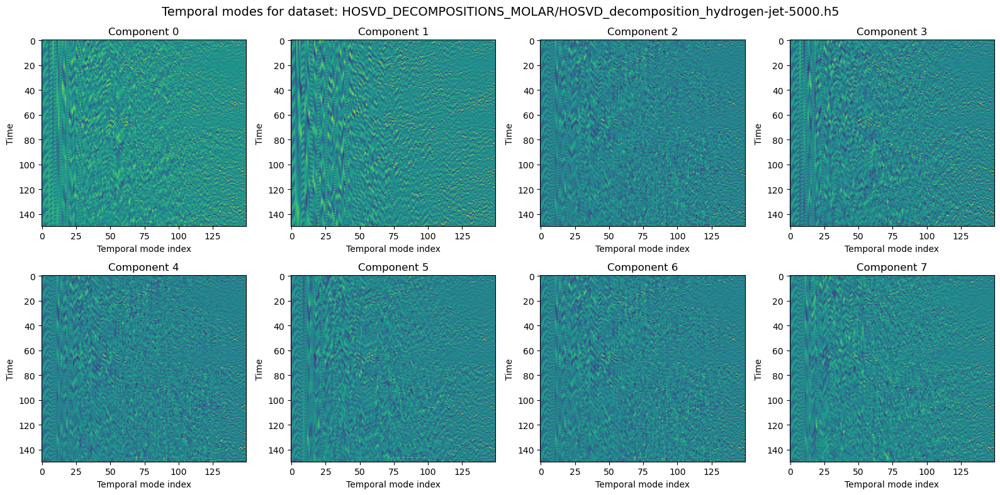

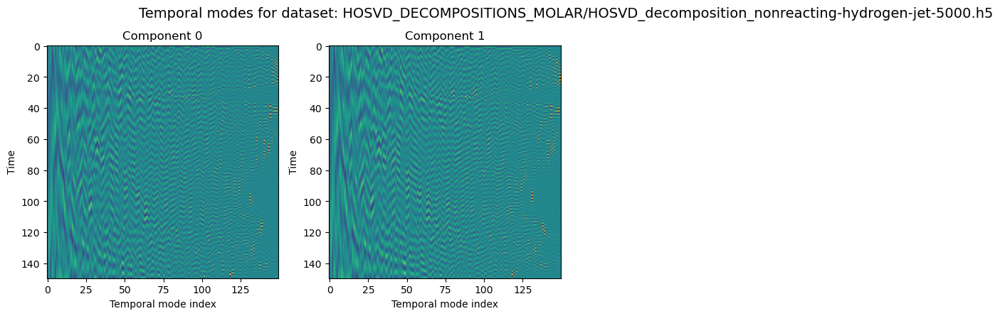

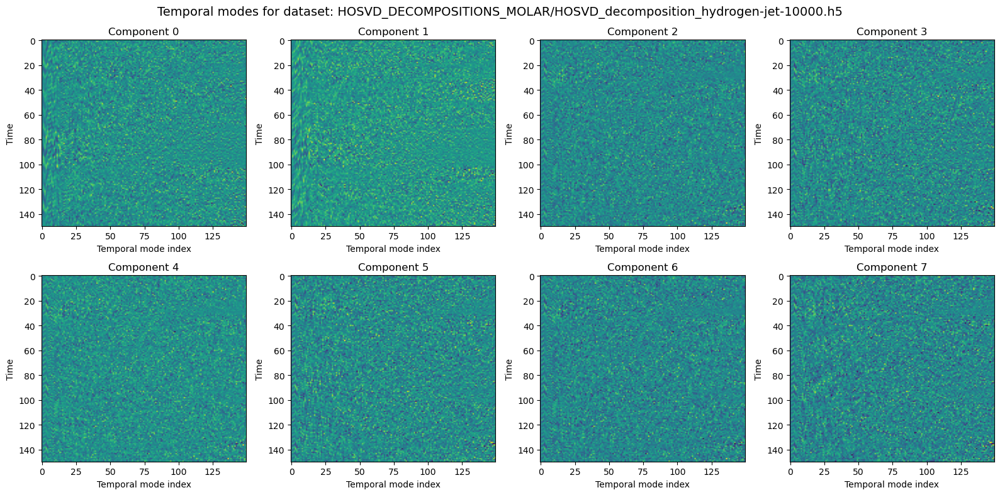

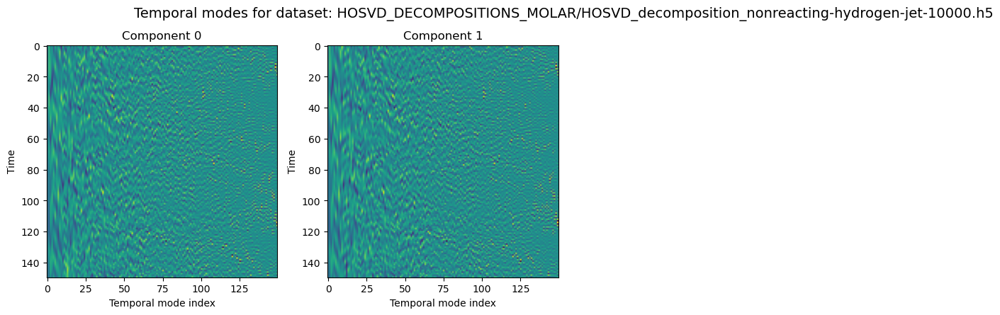

In [15]:
for key, value in data.items():
        
    core, U_x, U_y, U_chem, U_time = value.values()

    fig, axs = plt.subplots(2, 4, figsize=(16, 8))
    axs = axs.flatten()  

    n_components = min(U_chem.shape[1], 8)

    for i in range(n_components):
        reconstructed_tensor = reconstruct_with_single_mode(core, U_x, U_y, U_chem, U_time, mode_idx=i)
        unfolded_tensor_mode = tl.unfold(reconstructed_tensor, mode=2)

        new_U_t, sigma, _ = np.linalg.svd(unfolded_tensor_mode, full_matrices=False)

        axs[i].imshow(new_U_t, aspect='auto', cmap='viridis')
        axs[i].set_title(f'Component {i}')
        axs[i].set_xlabel('Temporal mode index')
        axs[i].set_ylabel('Time')

    # Hide the unused subplots
    for j in range(n_components, len(axs)):
        axs[j].set_visible(False)

    plt.suptitle(f"Temporal modes for dataset: {key}", fontsize=14)
    plt.tight_layout()
    plt.show()


# Frequency plot for each case

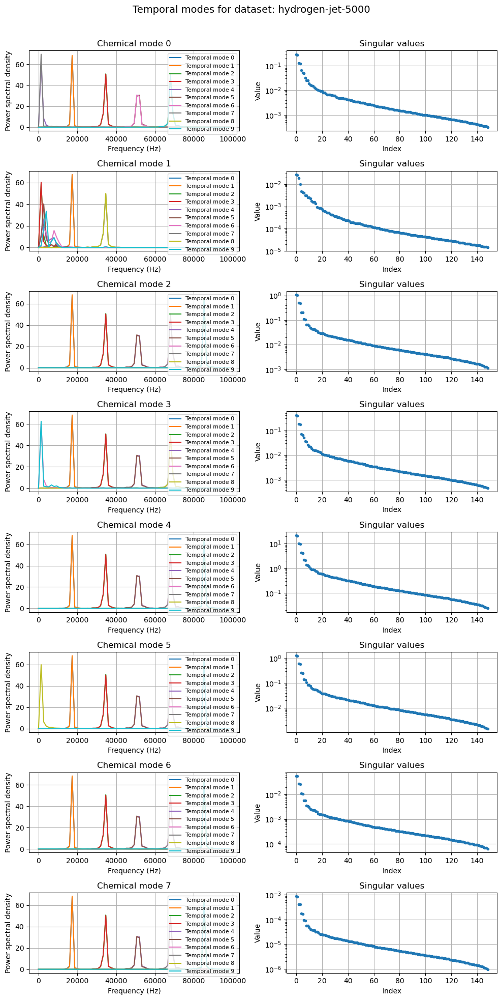

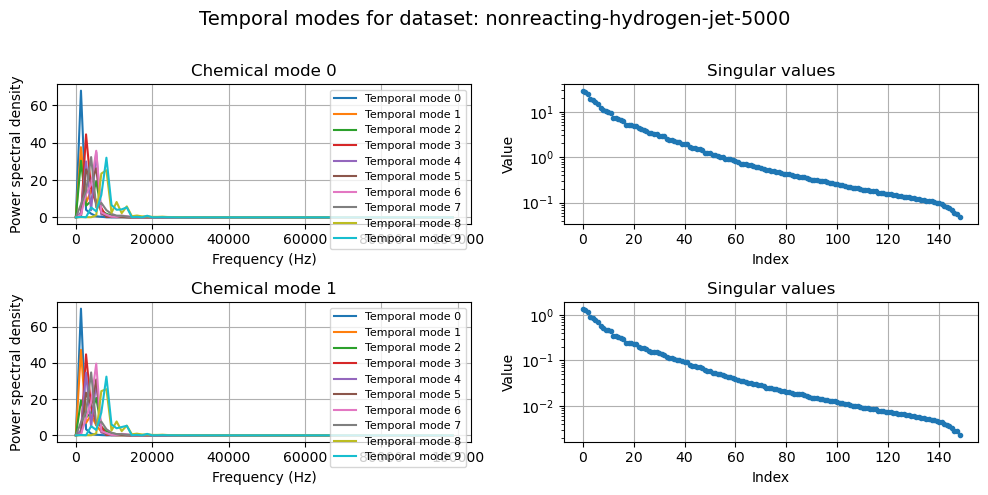

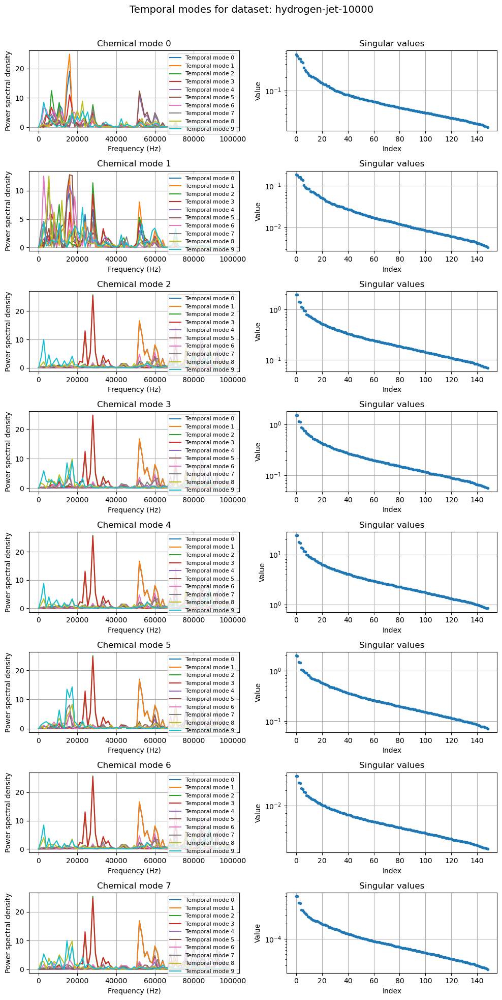

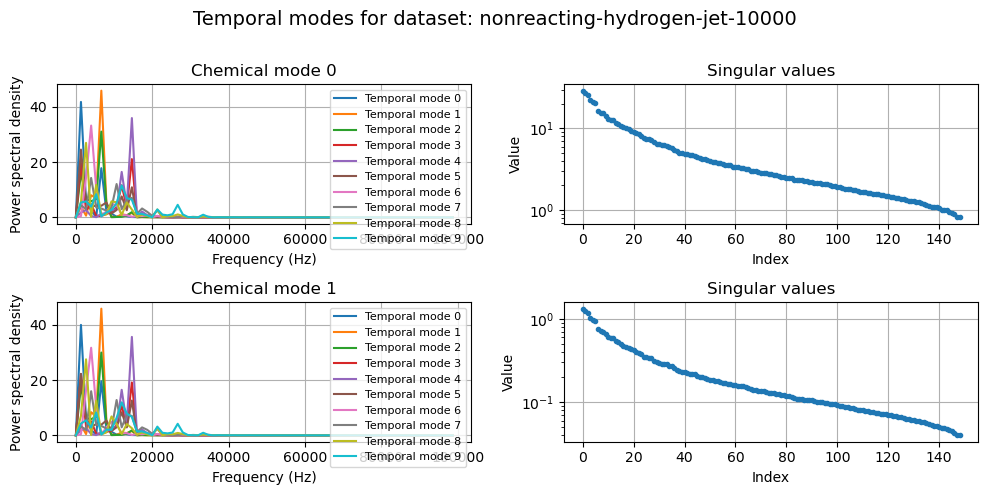

In [16]:
dt = 5e-06
for key, value in data.items():
    if "nonreacting" in key:
        x_size = 10
        y_size =5
    else:
        x_size = 10
        y_size = 20
    core, U_x, U_y, U_chem, U_time = value.values()
    title = key.split("_")[-1][:-3]
    
    n_components = min(U_chem.shape[1], 8)
    fig, axs = plt.subplots(n_components, 2, figsize=(x_size, y_size))
    
    for n in range(n_components):
        reconstructed_tensor = reconstruct_with_single_mode(core, U_x, U_y, U_chem, U_time, mode_idx=n)
        unfolded_tensor_mode = tl.unfold(reconstructed_tensor, mode=2)
        
        new_U_t, sigma, _ = np.linalg.svd(unfolded_tensor_mode, full_matrices=False)
        U_t_plot = new_U_t[:, 1:]
        sigma_plot = sigma[1:]
        num_modes = 10
        spectrums = fft(U_t_plot[:, :num_modes], axis=0)
        freqs = fftfreq(U_t_plot[:, :num_modes].shape[0], dt)
        psd = np.abs(spectrums)**2
        #--------------------------
        ax_left = axs[n, 0]
        ax_left.set_title(f"Chemical mode {n}")
        for i in range(num_modes):
            ax_left.plot(freqs[:len(freqs)//2], psd[:len(freqs)//2, i], label=f"Temporal mode {i}")
        ax_left.legend(fontsize=8)
        ax_left.grid(True)
        ax_left.set_xlabel("Frequency (Hz)")
        ax_left.set_ylabel("Power spectral density")
        #--------------------------
        ax_right = axs[n, 1]
        ax_right.plot(np.arange(len(sigma_plot)), sigma_plot, '.')  # constant line
        ax_right.set_title("Singular values")
        ax_right.set_xlabel("Index")
        ax_right.set_ylabel("Value")
        ax_right.set_yscale('log')
        ax_right.grid(True)

    plt.suptitle(f"Temporal modes for dataset: {title}", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig(f"PLOTS/{title}_temporal_modes.png", dpi=300, bbox_inches='tight')
    plt.show()


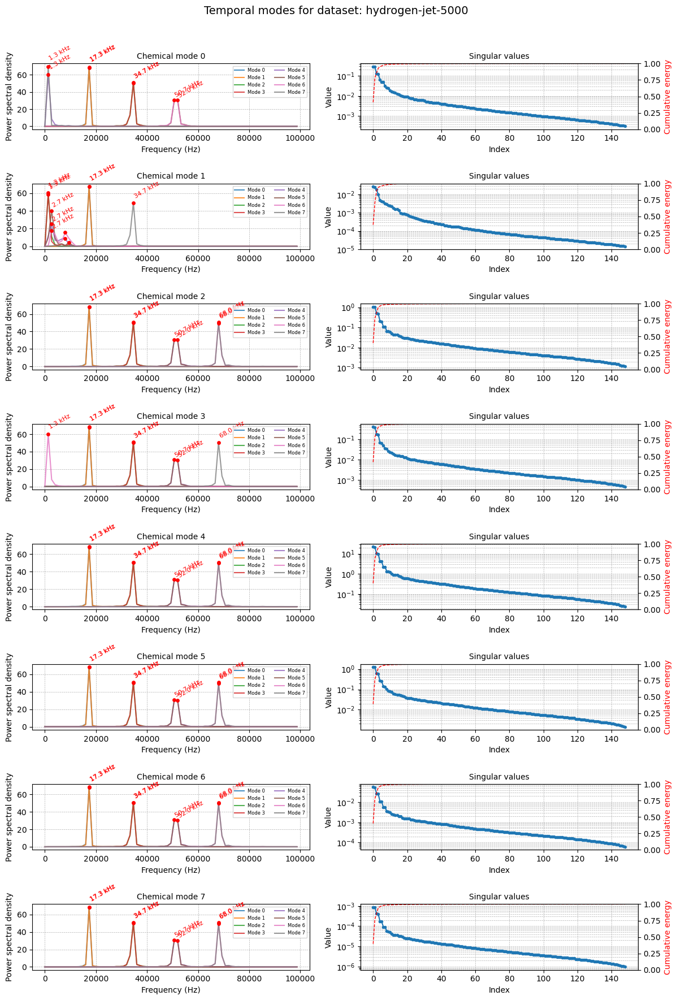

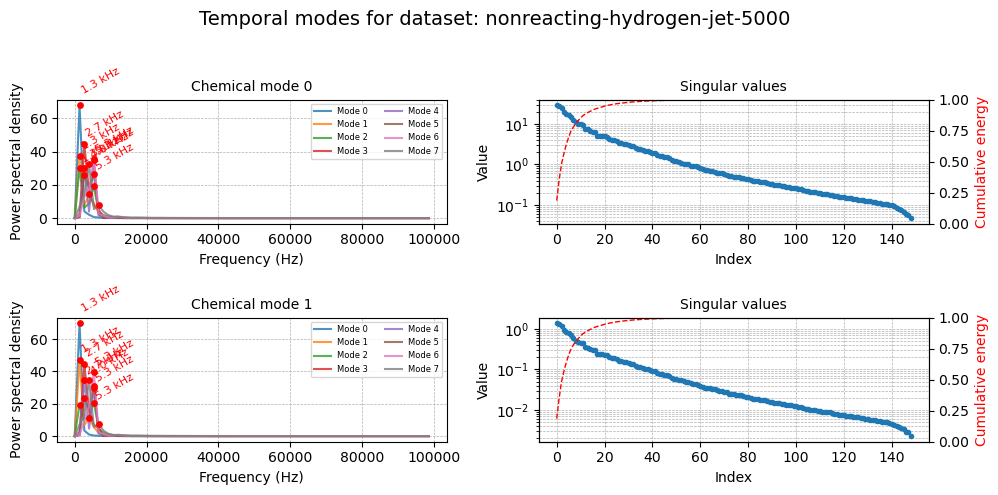

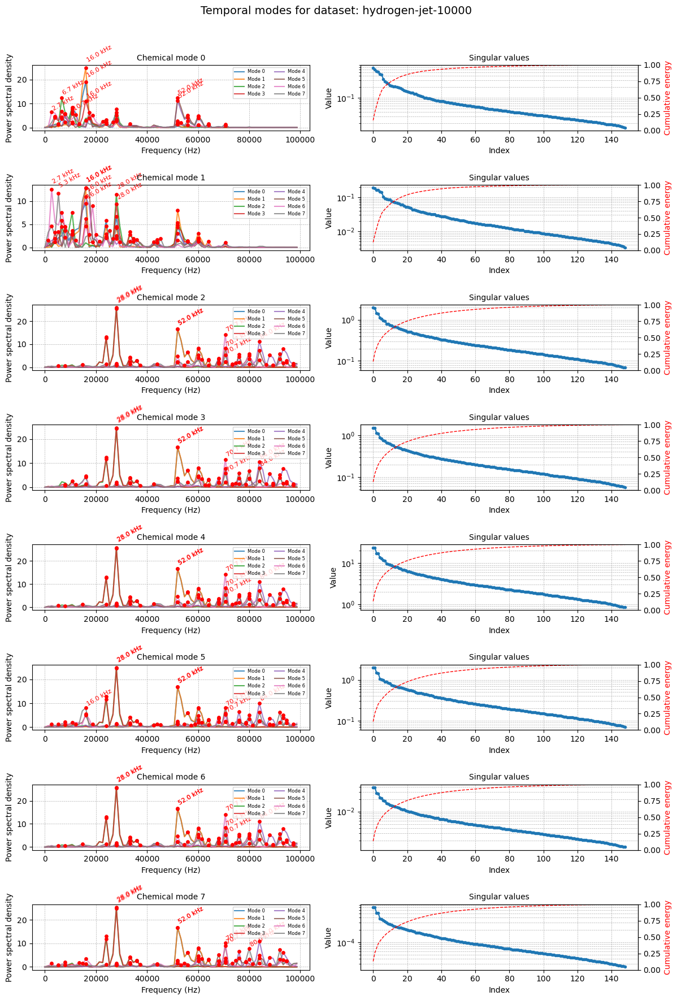

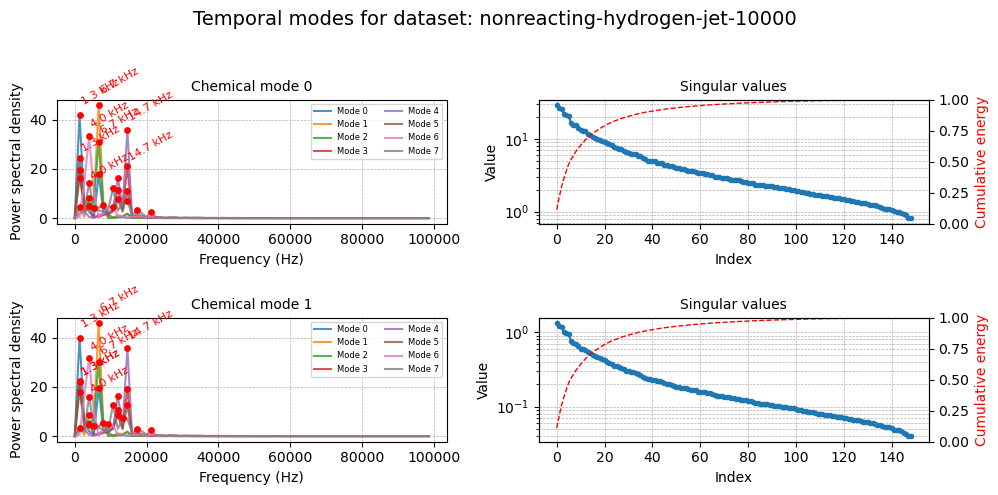

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from numpy.fft import fft, fftfreq

dt = 5e-06

for key, value in data.items():
    if "nonreacting" in key:
        x_size, y_size = 10, 5
    else:
        x_size, y_size = 12, 18

    core, U_x, U_y, U_chem, U_time = value.values()
    title = key.split("_")[-1][:-3]
    n_components = min(U_chem.shape[1], 8)

    fig, axs = plt.subplots(n_components, 2, figsize=(x_size, y_size))

    for n in range(n_components):
        reconstructed_tensor = reconstruct_with_single_mode(core, U_x, U_y, U_chem, U_time, mode_idx=n)
        unfolded_tensor_mode = tl.unfold(reconstructed_tensor, mode=2)

        new_U_t, sigma, _ = np.linalg.svd(unfolded_tensor_mode, full_matrices=False)
        U_t_plot = new_U_t[:, 1:]
        sigma_plot = sigma[1:]
        num_modes = min(8, U_t_plot.shape[1])

        spectrums = fft(U_t_plot[:, :num_modes], axis=0)
        freqs = fftfreq(U_t_plot.shape[0], dt)
        psd = np.abs(spectrums) ** 2

        # === Left: Power spectral density ===
        ax_left = axs[n, 0]
        ax_left.set_title(f"Chemical mode {n}", fontsize=10)

        for i in range(num_modes):
            psd_single = psd[:len(freqs)//2, i]
            fvals = freqs[:len(freqs)//2]

            # Plot each mode’s PSD
            ax_left.plot(fvals, psd_single, alpha=0.8, label=f"Mode {i}")

            # Highlight dominant peaks
            peaks, props = find_peaks(psd_single, height=np.max(psd_single) * 0.1)
            if len(peaks) > 0:
                ax_left.scatter(fvals[peaks], psd_single[peaks], color='red', s=15, zorder=5)
                # Annotate the top peak only
                top_idx = np.argmax(props['peak_heights'])
                dom_freq = fvals[peaks[top_idx]]
                ax_left.text(dom_freq, psd_single[peaks[top_idx]] * 1.1,
                             f"{dom_freq/1000:.1f} kHz", color='red', fontsize=8, rotation=30)

        #ax_left.set_xscale('log')
        #ax_left.set_yscale('log')
        ax_left.grid(True, which='both', ls='--', lw=0.5)
        ax_left.set_xlabel("Frequency (Hz)")
        ax_left.set_ylabel("Power spectral density")
        ax_left.legend(fontsize=6, loc='upper right', ncol=2)

        # === Right: Singular values + cumulative energy ===
        ax_right = axs[n, 1]
        ax_right.plot(np.arange(len(sigma_plot)), sigma_plot, 'o-', markersize=3)
        ax_right.set_yscale('log')
        ax_right.set_title("Singular values", fontsize=10)
        ax_right.set_xlabel("Index")
        ax_right.set_ylabel("Value")
        ax_right.grid(True, which='both', ls='--', lw=0.5)

        # Add cumulative energy curve
        cumulative_energy = np.cumsum(sigma_plot**2) / np.sum(sigma_plot**2)
        ax_r2 = ax_right.twinx()
        ax_r2.plot(np.arange(len(cumulative_energy)), cumulative_energy, 'r--', lw=1)
        ax_r2.set_ylabel("Cumulative energy", color='r')
        ax_r2.set_ylim(0, 1)

    plt.suptitle(f"Temporal modes for dataset: {title}", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    #plt.savefig(f"PLOTS/{title}_temporal_modes_enhanced.png", dpi=300, bbox_inches='tight')
    plt.show()


# Analysis of combustion scalars

In [18]:
import kagglehub
import json

n_snapshots = 200
subsample_x = 10
subsample_y = 10
data_path = kagglehub.dataset_download("sharmapushan/hydrogen-jet-7500")
print(f"Dataset path: {data_path}")

# Load metadata
with open(data_path + '/info.json') as f:
    metadata = json.load(f)
print(metadata)
Nx, Ny = metadata['global']['Nxyz']

# Load grid
X_filename = metadata['global']['grid']['x']
Y_filename = metadata['global']['grid']['y']
X = np.fromfile(data_path + '/' + X_filename, dtype='<f4').reshape(Ny, Nx)
Y = np.fromfile(data_path + '/' + Y_filename, dtype='<f4').reshape(Ny, Nx)

# Subsample grid
X_sub = X[::subsample_x, ::subsample_y]
Y_sub = Y[::subsample_x, ::subsample_y]
Nx_sub, Ny_sub = X_sub.shape

print(f"Original grid: ({Nx}, {Ny})")
print(f"Subsampled grid: ({Nx_sub}, {Ny_sub})")

# Define components to load
component_names = [#'RHO', 'UX', 'UY', 'T',
                    'YH', 'YH2', 'YO', 'YO2',
                    'YOH', 'YH2O', 'YHO2', 'YH2O2']
n_components = len(component_names)

# Initialize tensor: (x, y, components, time)
tensor = np.zeros((Nx_sub, Ny_sub, n_components, n_snapshots))

# Mapping from component names to file keys
file_key_map = {
    #'RHO': 'RHO_kgm-3 filename',
    #'UX': 'UX_ms-1 filename',
    #'UY': 'UY_ms-1 filename',
    #'T': 'T_K filename',
    'YH': 'YH filename',
    'YH2': 'YH2 filename',
    'YO': 'YO filename',
    'YO2': 'YO2 filename',
    'YOH': 'YOH filename',
    'YH2O': 'YH2O filename',
    'YHO2': 'YHO2 filename',
    'YH2O2': 'YH2O2 filename'
}


Dataset path: /home/isacco/.cache/kagglehub/datasets/sharmapushan/hydrogen-jet-7500/versions/2
{'global': {'dataset_id': 'sharmapushan/hydrogen-jet-7500', 'Nxyz': [1600, 2000], 'snapshots': 201, 'time-step snapshot [s]': 5e-06, 'time-step CFD [s]': 1e-08, 'variables': ['RHO_kgm-3', 'UX_ms-1', 'UY_ms-1', 'P_Pa', 'T_K', 'YH', 'YH2', 'YO', 'YO2', 'YOH', 'YH2O', 'YHO2', 'YH2O2'], 'compression': 'None', 'grid': {'x': './grid/X_m.dat', 'y': './grid/Y_m.dat'}, 'Re_jet': 7500, 'bc': {'description': 'Inflow-outflow in x- with inflow boundary condition, with pressure outlet in y-.', 'Ujet [ms-1]': 231, 'Ucoflow [ms-1]': 23.1, 'Tjet [K]': 400, 'Tcoflow [K]': 1100, 'jet mixture': 'H2:65,N2:35 by volume', 'coflow mixture': 'Air'}, 'ic': {'UX [ms-1]': 23.1, 'UY [ms-1]': 0.0, 'T [K]': 1100, 'P [Pa]': 101325, 'Mixture': 'Air'}, 'doi': '', 'contributors': 'Pushan Sharma, Wai Tong Chung and Matthias Ihme', 'description': '2D Lifted hydrogen jet flame at statistically steady state (Re = 7500)', 'chem_the

# Chemical components 

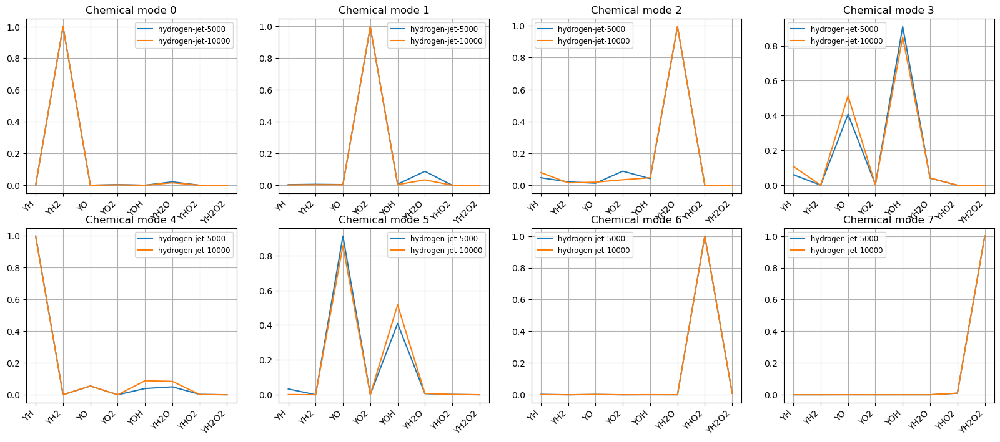

In [19]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8))
axes = axes.flatten()  

for i in range(0,8):
    ax = axes[i]
    for key, f in data.items():        
        if "nonreacting" not in key:
            core, U_x, U_y, U_chem, U_time = f.values() 
            label = key.split("_")[-1][:-3]
            ax.plot(np.abs(U_chem[:, i]), label=label)
            ax.set_title(f'Chemical mode {i}')
            ax.set_xticks(np.arange(len(component_names)))
            ax.set_xticklabels(component_names, rotation=45, ha='right')
            ax.legend(fontsize='small')
            ax.grid(visible = True)




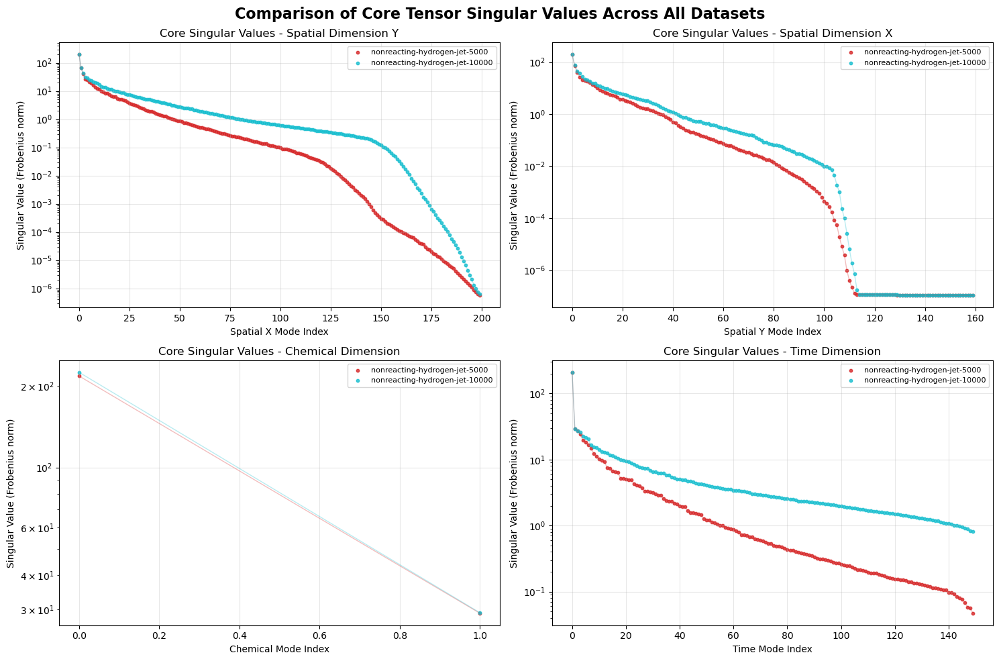

In [20]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
colors = plt.cm.tab10(np.linspace(0, 1, len(data)))

for idx, (key, f) in enumerate(data.items()):
    if 'nonreac' in key:
        core = f['core']
        dataset_name = key.split("_")[-1][:-3]
        color = colors[idx]
        
        sv_0 = [np.linalg.norm(core[i, :, :, :]) for i in range(core.shape[0])]
        ax = axes[0, 0]
        ax.scatter(range(len(sv_0)), sv_0, color=color, s=10, alpha=0.8, label=dataset_name)
        ax.plot(range(len(sv_0)), sv_0, color=color, alpha=0.3, linewidth=1)
        
        sv_1 = [np.linalg.norm(core[:, i, :, :]) for i in range(core.shape[1])]
        ax = axes[0, 1]
        ax.scatter(range(len(sv_1)), sv_1, color=color, s=10, alpha=0.8, label=dataset_name)
        ax.plot(range(len(sv_1)), sv_1, color=color, alpha=0.3, linewidth=1)
        
        sv_chem = [np.linalg.norm(core[:, :, i, :]) for i in range(core.shape[2])]
        ax = axes[1, 0]
        ax.scatter(range(len(sv_chem)), sv_chem, color=color, s=10, alpha=0.8, label=dataset_name)
        ax.plot(range(len(sv_chem)), sv_chem, color=color, alpha=0.3, linewidth=1)
        
        sv_time = [np.linalg.norm(core[:, :, :, i]) for i in range(core.shape[3])]
        ax = axes[1, 1]
        ax.scatter(range(len(sv_time)), sv_time, color=color, s=10, alpha=0.8, label=dataset_name)
        ax.plot(range(len(sv_time)), sv_time, color=color, alpha=0.3, linewidth=1)

ax = axes[0, 0]
ax.set_xlabel('Spatial X Mode Index')
ax.set_ylabel('Singular Value (Frobenius norm)')
ax.set_title('Core Singular Values - Spatial Dimension Y') #attenzione
ax.grid(True, alpha=0.3)
ax.set_yscale('log')
ax.legend(fontsize=8, loc='best')

ax = axes[0, 1]
ax.set_xlabel('Spatial Y Mode Index')
ax.set_ylabel('Singular Value (Frobenius norm)')
ax.set_title('Core Singular Values - Spatial Dimension X') #attenzione
ax.grid(True, alpha=0.3)
ax.set_yscale('log')
ax.legend(fontsize=8, loc='best')

ax = axes[1, 0]
ax.set_xlabel('Chemical Mode Index')
ax.set_ylabel('Singular Value (Frobenius norm)')
ax.set_title('Core Singular Values - Chemical Dimension')
ax.grid(True, alpha=0.3)
ax.set_yscale('log')
ax.legend(fontsize=8, loc='best')

ax = axes[1, 1]
ax.set_xlabel('Time Mode Index')
ax.set_ylabel('Singular Value (Frobenius norm)')
ax.set_title('Core Singular Values - Time Dimension')
ax.grid(True, alpha=0.3)
ax.set_yscale('log')
ax.legend(fontsize=8, loc='best')

fig.suptitle('Comparison of Core Tensor Singular Values Across All Datasets', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


Dataset: HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_hydrogen-jet-5000.h5
Mode 0: min=-0.0145, max=0.0024, mean=-0.0108
Mode 1: min=-0.0010, max=0.0021, mean=-0.0002
Mode 2: min=-0.0154, max=0.0009, mean=-0.0016
Mode 3: min=-0.0005, max=0.0169, mean=0.0029
Mode 4: min=-0.0001, max=0.3241, mean=0.0294
Mode 5: min=-0.0012, max=0.0220, mean=0.0034
Mode 6: min=-0.0008, max=0.0000, mean=-0.0001
Mode 7: min=-0.0000, max=0.0000, mean=-0.0000


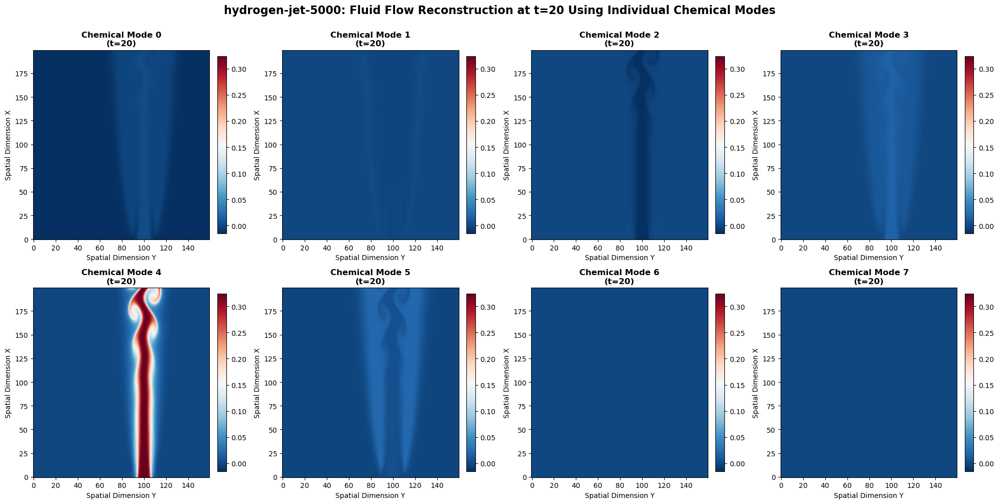


Dataset: HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_nonreacting-hydrogen-jet-5000.h5
Mode 0: min=-0.0000, max=0.3250, mean=0.0460
Mode 1: min=0.0000, max=0.0146, mean=0.0125


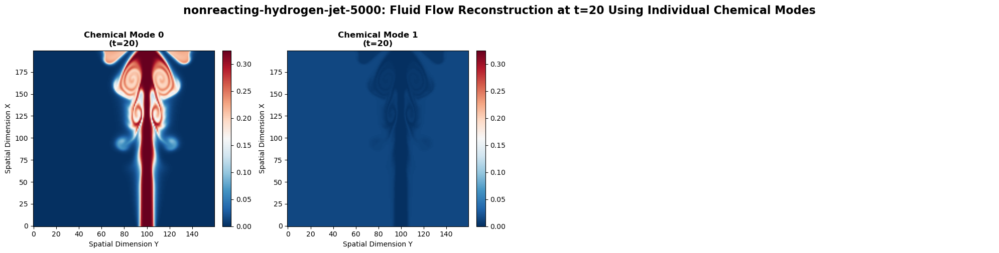


Dataset: HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_hydrogen-jet-10000.h5
Mode 0: min=-0.0146, max=0.0016, mean=-0.0114
Mode 1: min=-0.0012, max=0.0029, mean=-0.0001
Mode 2: min=-0.0258, max=0.0009, mean=-0.0027
Mode 3: min=-0.0002, max=0.0325, mean=0.0044
Mode 4: min=-0.0001, max=0.3223, mean=0.0316
Mode 5: min=-0.0039, max=0.0210, mean=0.0016
Mode 6: min=-0.0005, max=0.0000, mean=-0.0000
Mode 7: min=-0.0000, max=0.0000, mean=-0.0000


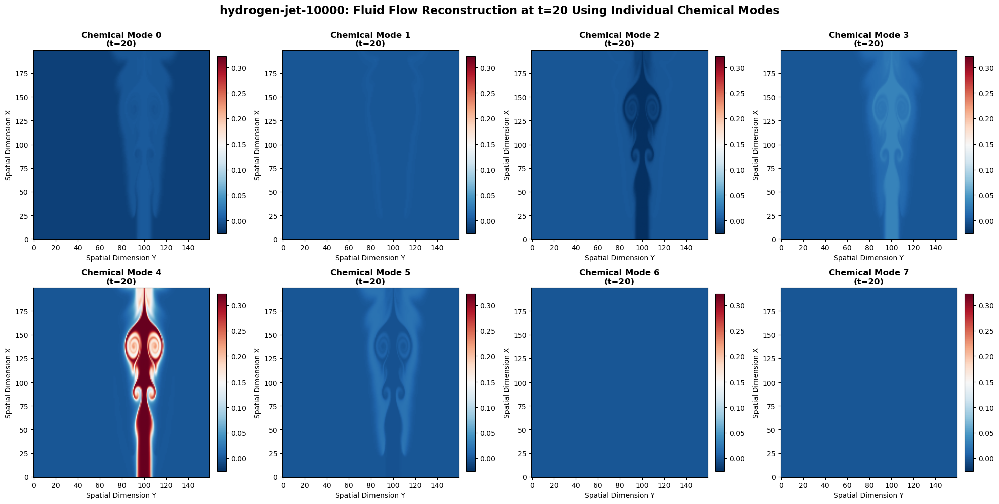


Dataset: HOSVD_DECOMPOSITIONS_MOLAR/HOSVD_decomposition_nonreacting-hydrogen-jet-10000.h5
Mode 0: min=-0.0000, max=0.3250, mean=0.0438
Mode 1: min=0.0000, max=0.0146, mean=0.0126


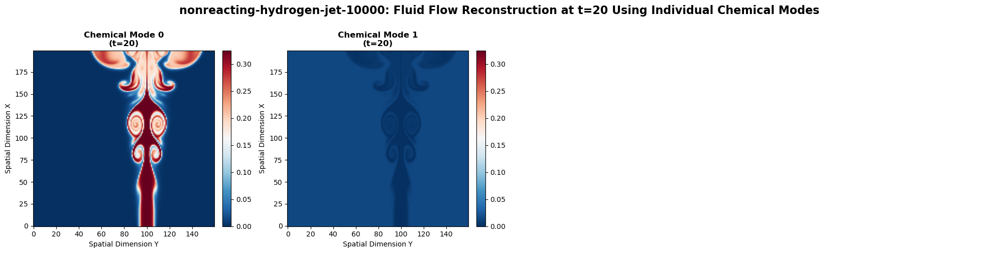

In [22]:

t = 20
for key, f in data.items():
    print(f"\n{'='*60}")
    print(f"Dataset: {key}")
    print(f"{'='*60}")

    core, U_x, U_y, U_chem, U_time = f.values()
    n_modes = U_chem.shape[1]

    reconstructions = []
    for mode in range(n_modes):
        recon = reconstruct_with_single_mode(core, U_x, U_y, U_chem, U_time, mode, time_idx=t)
        # Sum over chemical dimension if needed
        if recon.ndim == 4:  # (Nx, Ny, Nchem, Nt)
            recon_2d = np.sum(recon[:, :, :, t], axis=2)  # Sum over chemical species at time t
        elif recon.ndim == 3:  # (Nx, Ny, Nt)
            recon_2d = recon[:, :, t]
        else:
            recon_2d = recon
        reconstructions.append(recon_2d)
        print(f"Mode {mode}: min={recon_2d.min():.4f}, max={recon_2d.max():.4f}, mean={recon_2d.mean():.4f}")

    n_cols = 4
    n_rows = int(np.ceil(n_modes / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
    axes = axes.flatten() if n_modes > 1 else [axes]

    # Find global min/max for consistent color scaling
    vmin = min(r.min() for r in reconstructions)
    vmax = max(r.max() for r in reconstructions)

    for mode in range(n_modes):
        ax = axes[mode]
        im = ax.imshow(reconstructions[mode], cmap='RdBu_r', aspect='auto',
                      origin='lower', vmin=vmin, vmax=vmax)
        ax.set_title(f'Chemical Mode {mode}\n(t={t})', fontsize=12, fontweight='bold')
        ax.set_xlabel('Spatial Dimension Y')
        ax.set_ylabel('Spatial Dimension X')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    # Hide unused subplots
    for idx in range(n_modes, len(axes)):
        axes[idx].axis('off')

    # Extract dataset name properly
    dataset_name = key.split('/')[-1].replace('HOSVD_decomposition_', '').replace('.h5', '')

    plt.suptitle(f'{dataset_name}: Fluid Flow Reconstruction at t={t} Using Individual Chemical Modes',
                fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()